## Example Code for SDXL with FRDiff

## Install all requirements

In [ ]:
!git clone https://github.com/Jungwon-Lee/FRDiff

!pip install torch transformers accelerate
!pip install diffusers==0.26.3

In [1]:
# Move Stable-Diffusion directory
%cd Stable-Diffusion

/NAS/LJW/240228_FRDiff_eccv/FRDiff/Stable-Diffusion


## Load SDXL

In [2]:
import torch

from diffusers.pipelines.stable_diffusion_xl.pipeline_stable_diffusion_xl import StableDiffusionXLPipeline
from diffusers import StableDiffusionPipeline, DDIMScheduler

# Stable Diffusion 1.4
# pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", variant="fp16", torch_dtype=torch.float16)

# SDXL
pipe = StableDiffusionXLPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", 
                                                 variant="fp16", torch_dtype=torch.float16, 
                                                 use_safetensors=True)

pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.to(f'cuda')

/opt/conda/envs/diffuser/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/envs/diffuser/lib/python3.8/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/opt/conda/envs/diffuser/lib/python3.8/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00,  7.68it/s]


StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.26.3",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## Sampling Options

In [3]:
seed = 0

# Sampling Step
num_steps = 50

# Set your prompt !
prompt = "a photo of an astronaut on a moon"

## DDIM Sampling

100%|██████████| 50/50 [00:12<00:00,  3.86it/s]


CPU times: user 12 s, sys: 2.04 s, total: 14 s
Wall time: 14 s


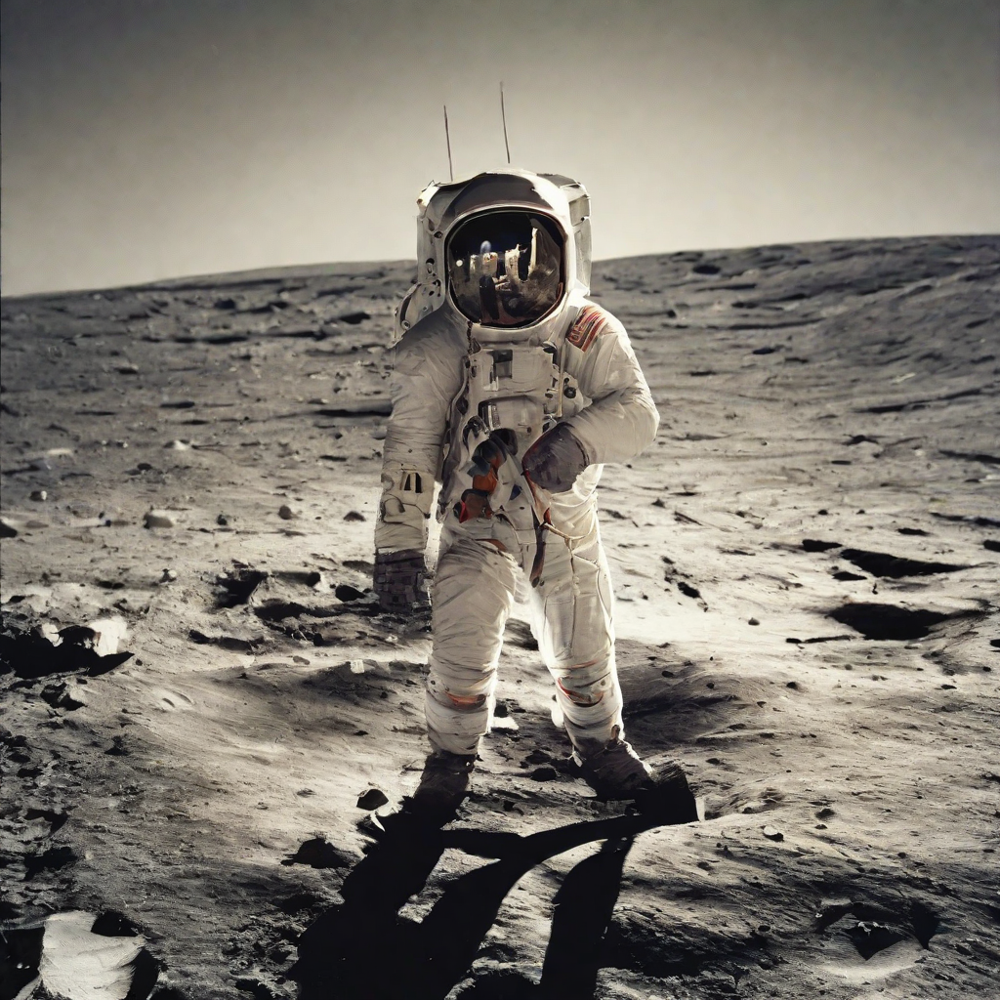

In [4]:
%%time

generator = torch.Generator().manual_seed(seed)

image_ddim = pipe(prompt, generator=generator, num_inference_steps=num_steps).images[0]

image_ddim

## FRDiff Sampling

In [5]:
from frdiff import wrapping_frdiff

# Set Feature Reuse(FR) Interval. The larger FR interval, the faster sampling speed.
# We recommand interval 2 or 3.
num_steps = 50
interval = 2
wrapping_frdiff(pipe, num_steps, interval)

[SKIPPING] Buffer Sharing Complete
Convert <class 'diffusers.models.resnet.ResnetBlock2D'> to <class 'diffusers.models.resnet.ResnetBlock2D'>
Convert <class 'diffusers.models.resnet.ResnetBlock2D'> to <class 'diffusers.models.resnet.ResnetBlock2D'>
Convert <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'> to <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'>
Convert <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'> to <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'>
Convert <class 'diffusers.models.resnet.ResnetBlock2D'> to <class 'diffusers.models.resnet.ResnetBlock2D'>
Convert <class 'diffusers.models.resnet.ResnetBlock2D'> to <class 'diffusers.models.resnet.ResnetBlock2D'>
Convert <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'> to <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'>
Convert <class 'diffusers.models.transformers.transformer_2d

100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


CPU times: user 6.54 s, sys: 931 ms, total: 7.47 s
Wall time: 7.46 s


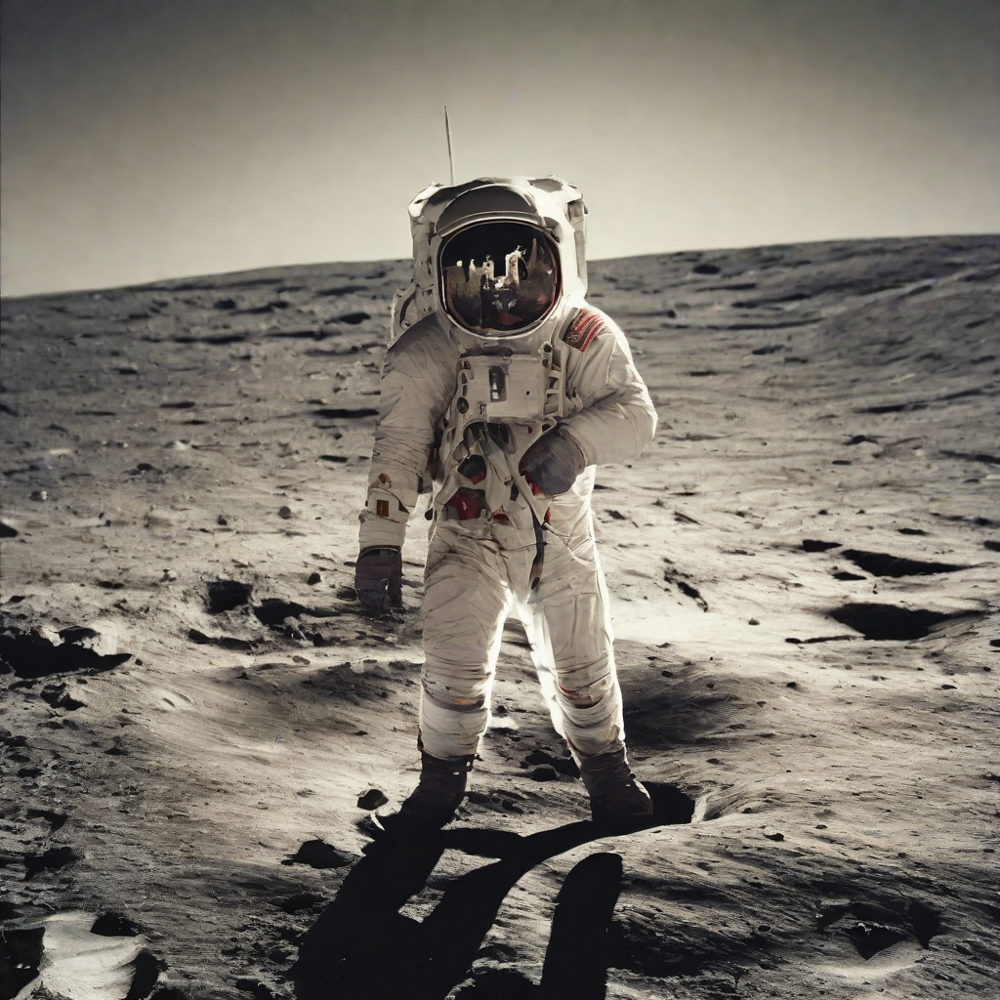

In [6]:
%%time

generator = torch.Generator().manual_seed(seed)

image_frdiff = pipe(prompt, generator=generator, num_inference_steps=num_steps).images[0]

image_frdiff

## Comparison with DDIM

## Left (DDIM), Right (Ours)

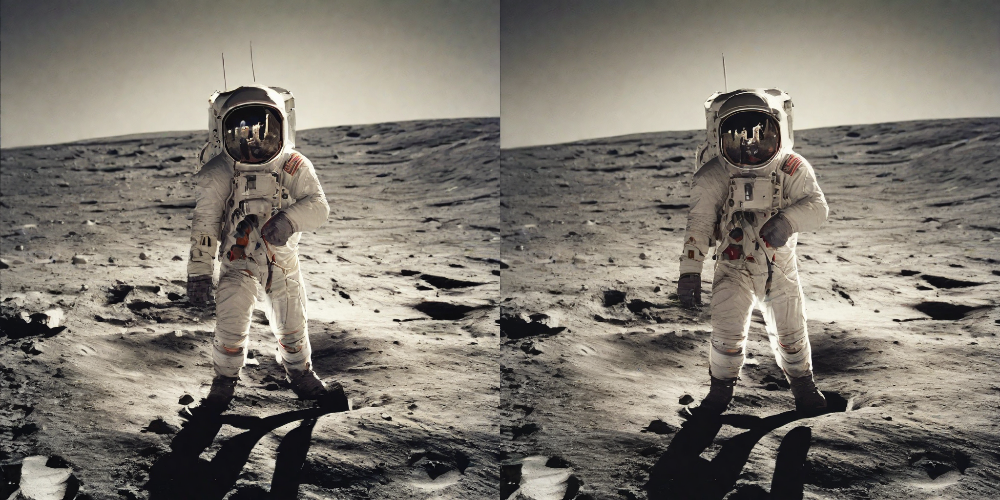

In [7]:
from sample import image_grid

image_grid([image_ddim, image_frdiff], 1, 2, padding=0)
